In [1]:
import sys,os,time 
import h5py

import numpy as np
import pandas as pd

import matplotlib.pyplot as plt

from scipy.optimize import curve_fit
from scipy.special import expit
plt.rcParams.update({'font.size': 18})

In [2]:
day_str    = "20230216"
V_led      = 4.0
# f_avg_name = day_str+"_avg_pulses.h5"
f_avg_name = day_str+"_avg_pulses_Vled_"+str(V_led)+".h5"
data       = pd.read_hdf(f_avg_name, key="data")

temps_mK   = np.array(data.keys()[1:]).astype(float)
print(temps_mK)

## How much attenuation is in the lines before the chip
line_atten_dB = 56.5

[350. 325. 300. 275. 250. 225. 200. 175. 150. 125.  75.  50.  25.]


In [3]:
t0 = 4.99 
def exp_fit(t,A,tau):
    return A*np.exp(-t/tau)*np.heaviside(t-t0,0.5)

def double_exp(t,a,tau,kappa):
    shape = a * (1 - expit(-(t-t0)/tau)) * expit(-(t-t0)/kappa) *np.heaviside(t-t0,0.5)
    return shape

# def delayed_shape(t,a0,tau0,kappa0):
#     delayed = a0 * (1 - expit(-(t-t0)/tau0)) * np.exp(-(t-t0)/kappa0) *np.heaviside(t-t0,0.5)
#     return delayed

# def prompt_shape(t,aP,tauP,kappaP):

def pulse_shape(t,Ad,Ap,tauP,kappaP):
    prompt = double_exp(t,Ap,tauP,kappaP)
    return prompt + Ad*delayed/np.max(delayed)

def dbl_pls_shape(t,aD,tD,kD,aP,tP,kP):
    prmpt = aP * (1 - expit(-(t-t0)/tP)) * expit(-(t-t0)/kP)
    delay = aD * (1 - expit(-(t-t0)/tD)) * expit(-(t-t0)/kD)
    return (prmpt+delay)*np.heaviside(t-t0,0.5)

350mK----------
-- Exp guess: 0.0600000000000005 ms Amp: 1.2240294779921438e+34
325mK----------
-- Exp guess: 0.040000000000000036 ms Amp: 3.1903108115131134e+52
300mK----------
-- Exp guess: 0.040000000000000036 ms Amp: 6.572208519521144e+52
275mK----------
-- Exp guess: 0.040000000000000036 ms Amp: 1.0487082344541444e+53
250mK----------
-- Exp guess: 0.05999999999999872 ms Amp: 1.3441216833884595e+35
225mK----------
-- Exp guess: 0.09999999999999876 ms Amp: 5.997827957926541e+20
200mK----------
-- Exp guess: 0.1399999999999988 ms Amp: 444273779789622.0
175mK----------
-- Exp guess: 0.23999999999999932 ms Amp: 156807382.80584192
150mK----------
-- Exp guess: 0.33999999999999986 ms Amp: 337597.5461782029
125mK----------
-- Exp guess: 0.5599999999999996 ms Amp: 880.8665192838527
75mK----------
-- Exp guess: 1.1799999999999997 ms Amp: 5.655771504477117
50mK----------
-- Exp guess: 1.4799999999999995 ms Amp: 1.7504015549144814
25mK----------
-- Exp guess: 1.5799999999999992 ms Amp: 1.1906

(4.5, 10.0)

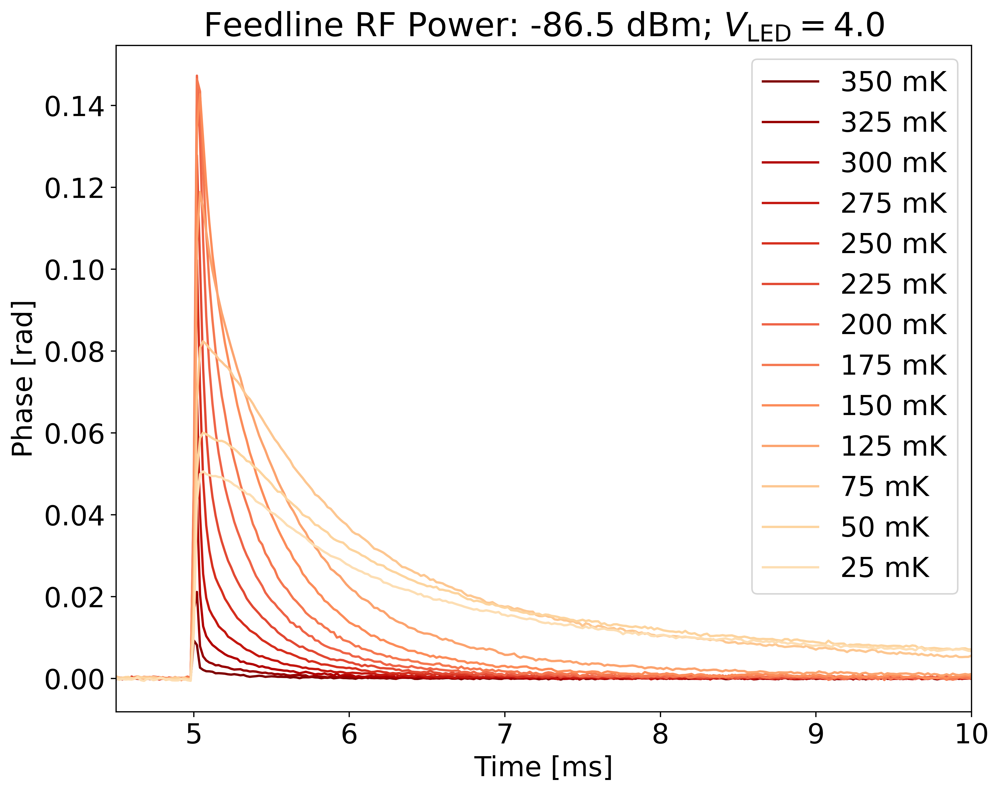

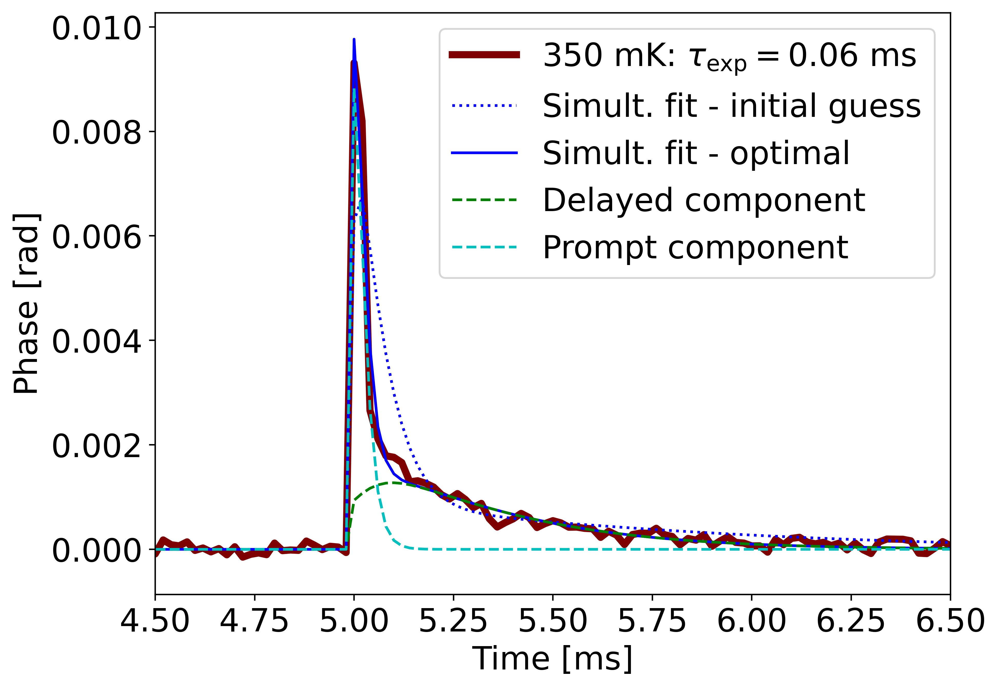

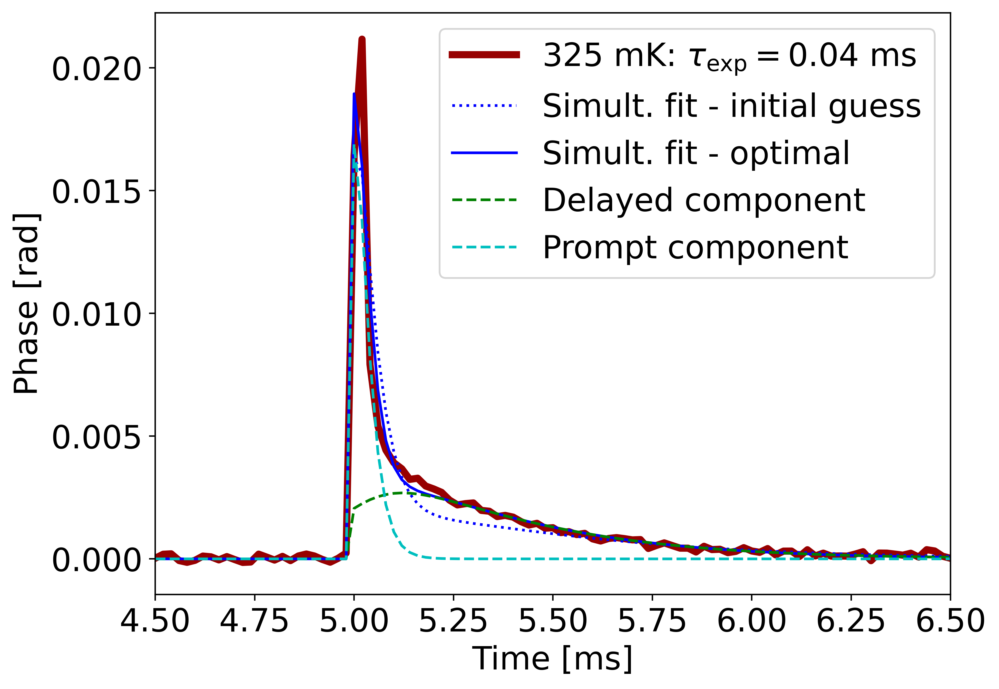

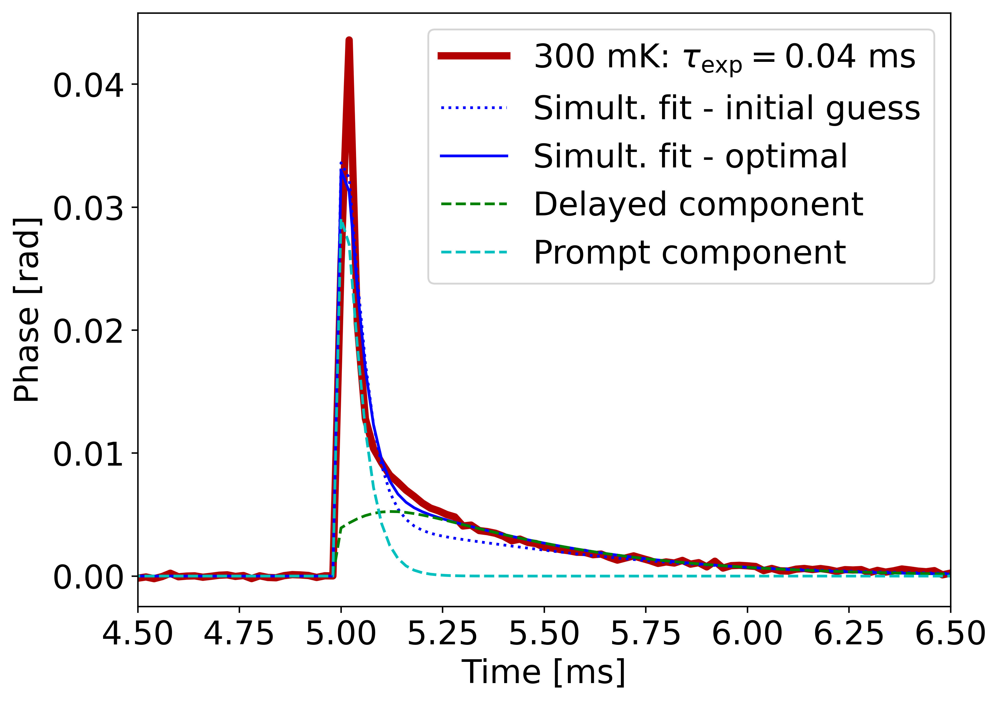

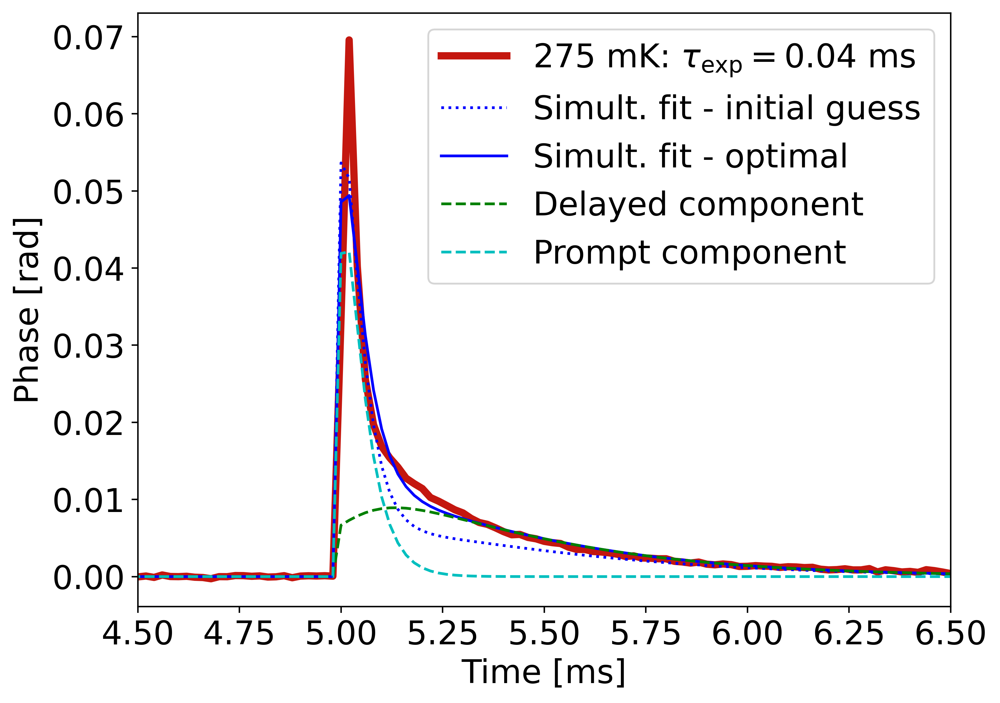

...

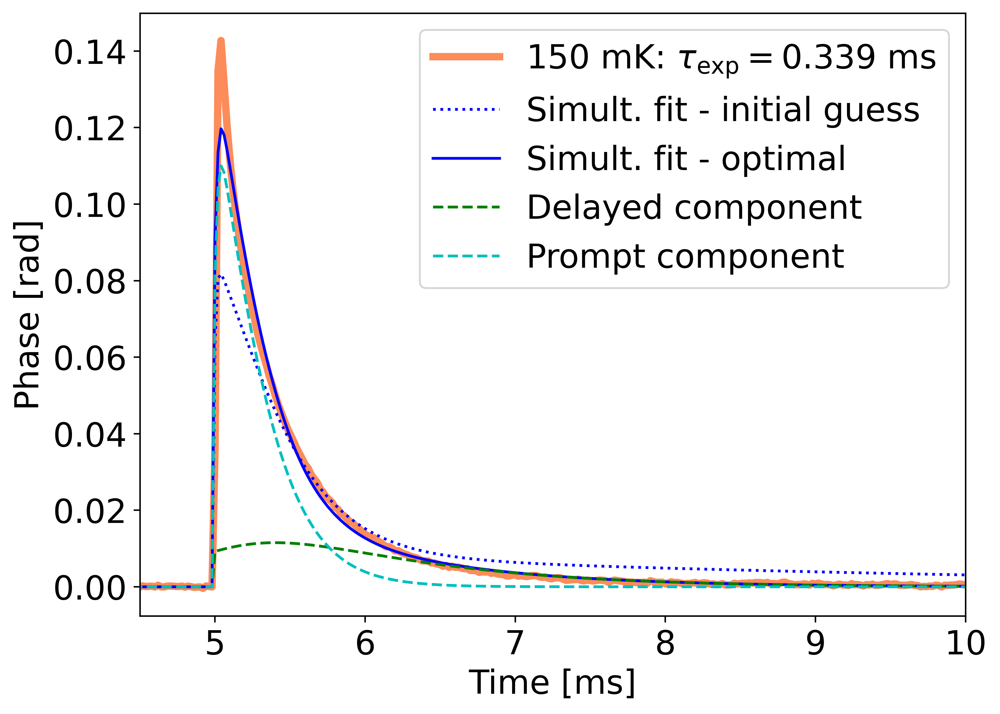

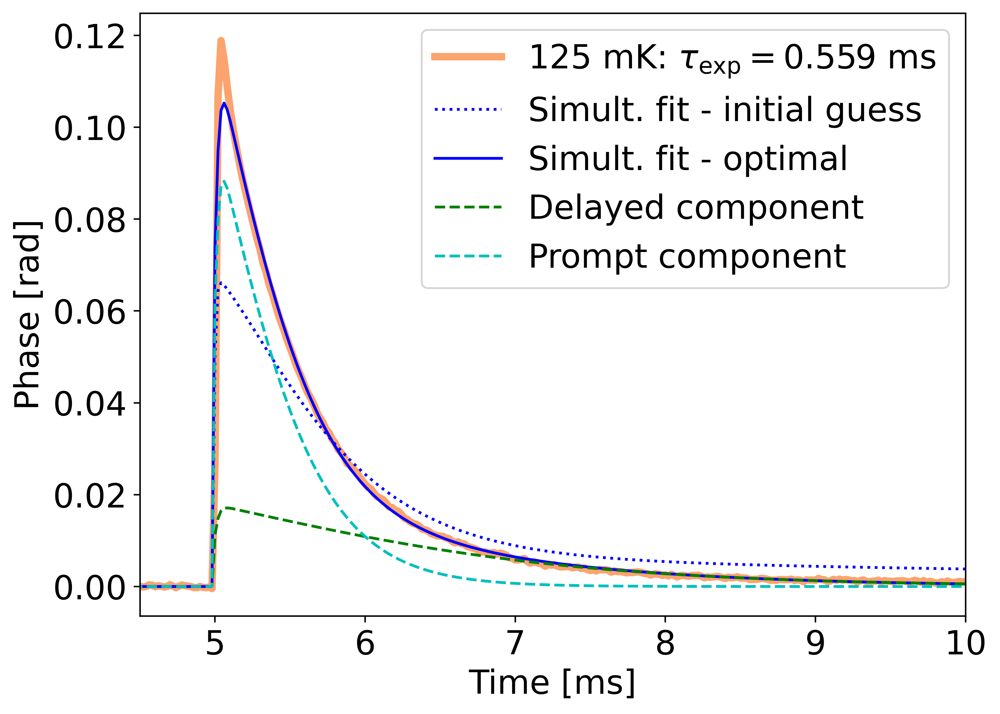

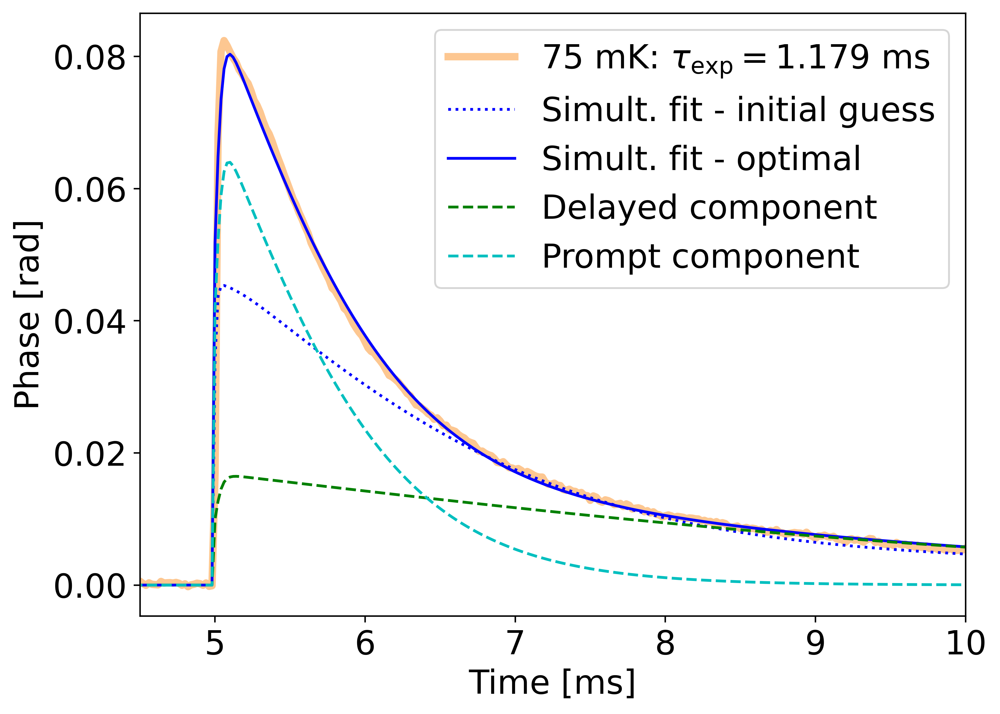

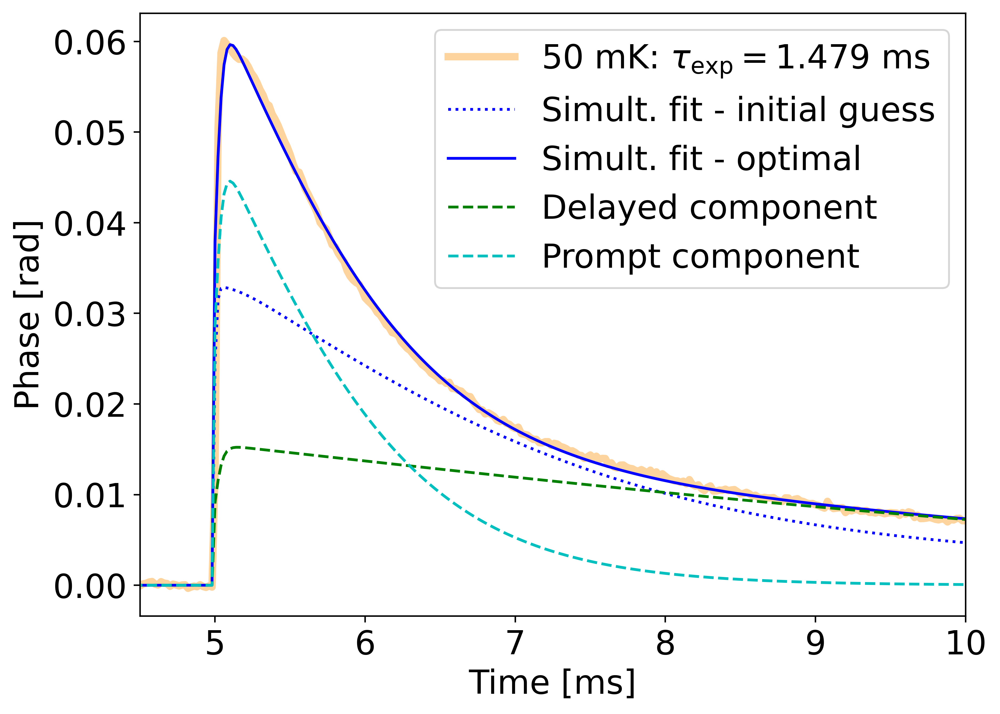

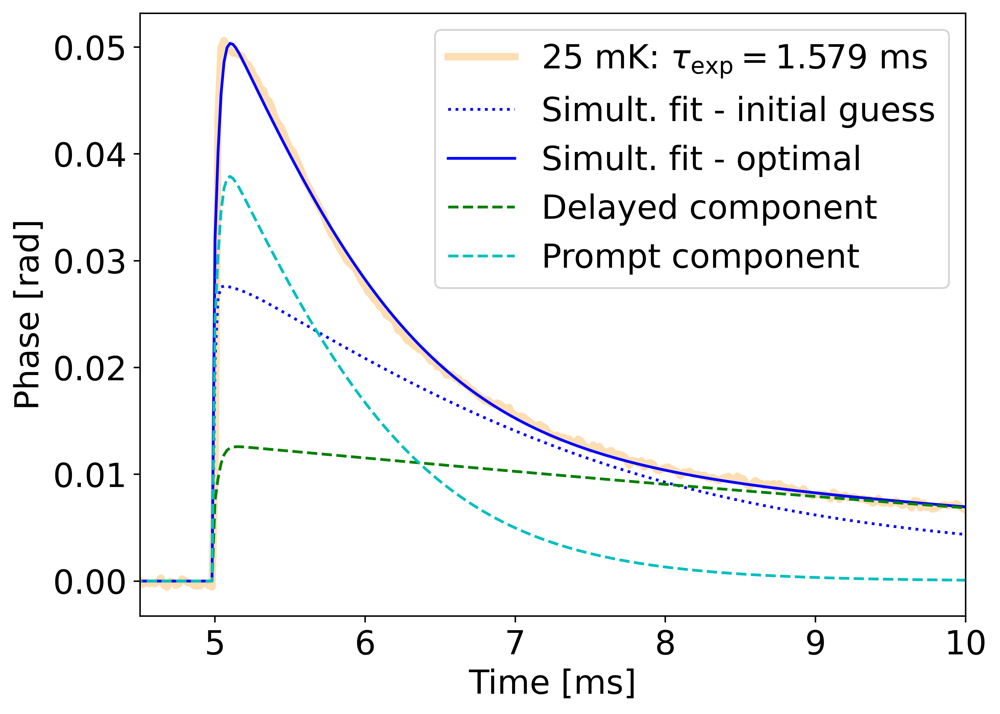

In [4]:
## Create a figure for all pulses
plt.figure("A",figsize=(10,8),dpi=500)
ax0 = plt.gca()
ax0.set_xlabel("Time [ms]")
ax0.set_ylabel("Phase [rad]")
ax0.set_title("Feedline RF Power: "+str(-30-line_atten_dB)+r" dBm; $V_\mathrm{LED}=$"+str(4.00))
cmap = plt.get_cmap('OrRd')
xlims = [4.5, 10.0]

## Initialize containers for our initial guesses
N_temps = len(temps_mK)
lifetimes  = np.zeros(N_temps)
amplitudes = np.zeros(N_temps)

prompt_fall_ms = np.zeros(N_temps)
delayd_fall_ms = np.zeros(N_temps)
prompt_rise_ms = np.zeros(N_temps)
delayd_rise_ms = np.zeros(N_temps)
pulse_max_phse = np.zeros(N_temps)

for i in np.arange(N_temps):
    k = data.keys()[1+i]
    print(k+ "mK----------")
    
    ## Get the color for this temperature
    color=cmap( (float(k)+50) / (np.max(temps_mK)+50) )
    
    ## Pull the averate pulse and time values
    t_vals = np.array(data["time(ms)"]) #- ts
    p_vals = np.array(data[k])
    
    p_vals = p_vals[t_vals<15.0]
    t_vals = t_vals[t_vals<15.0]
    
    ## Make some guesses of the prompt parameters
    _p_max = np.max(p_vals)
    _t_max = t_vals[np.argmax(p_vals)]
    _p_1pe = _p_max*np.exp(-1)
    _p_2pe = _p_max*np.exp(-2)
    _p_3pe = _p_max*np.exp(-3)
    
    _ts_vals = t_vals[t_vals>t0][3:]
    _ps_vals = p_vals[t_vals>t0][3:]
    
    _t_1pe = _ts_vals[np.argmin(np.abs(_ps_vals-_p_1pe))]
    _t_2pe = _ts_vals[np.argmin(np.abs(_ps_vals-_p_2pe))]
    _t_3pe = _ts_vals[np.argmin(np.abs(_ps_vals-_p_3pe))]
    
    ## Turn those quantities into parameters - this are the prompt values
    tau_guess = _t_1pe - _t_max
    amp_guess = np.max(p_vals)*np.exp(t0/tau_guess)
    
    ## Initialize our guess array for fitting to a single exponential
    popt = [ amp_guess, np.max([0.01,tau_guess]) ]
    print("-- Exp guess:", popt[1], "ms", "Amp:",amp_guess)
    
    ## Save our calculated guesses
    lifetimes[i]  = popt[1]
    amplitudes[i] = popt[0]
    
#     #### === FIT DELAYED COMPONENT === ###
    
#     delayed_t = 0.01
#     delayed_a = np.max(p_vals) * np.exp((_t_max-t0)/popt[1]) / (1-np.exp(-(_t_max-t0)/delayed_t))
    
#     ## Prepare to plot the delayed guess
#     delayed_opt = [delayed_a,delayed_t,popt[1]]
#     delayed = double_exp(t_vals,delayed_opt[0],delayed_opt[1],delayed_opt[2])
    
#     ## Fit the delayed shape
#     delayed_opt, delayed_cov = curve_fit(double_exp,t_vals,p_vals,p0=delayed_opt,bounds=(0,np.inf))
#     delayed = double_exp(t_vals,delayed_opt[0],delayed_opt[1],delayed_opt[2])
    
#     print("-- Delay guess:", delayed_opt[2], "ms","Rise time:",delayed_opt[1],"ms")
    
#     #### === ==================== === ###
    
#     #### === FIT PROMPT COMPONENT === ###
    
#     ## Prepare to plot the prompt guess
#     prompt_opt = [0.5,0.5,delayed_t/10.,popt[1]]
#     prompt = pulse_shape(t_vals,prompt_opt[0],prompt_opt[1],prompt_opt[2],prompt_opt[3])
    
#     ## Fit the prompt shape
#     prompt_opt, prompt_cov = curve_fit(pulse_shape,t_vals,p_vals,p0=prompt_opt,bounds=(0,np.inf))
#     prompt = pulse_shape(t_vals,prompt_opt[0],prompt_opt[1],prompt_opt[2],prompt_opt[3])
    
#     print("-- Prompt guess:", prompt_opt[3], "ms","Rise time:",delayed_opt[2],"ms")
#     print("-- Weights: delay=",prompt_opt[0],"prompt=",prompt_opt[1])
    
#     #### === ==================== === ###

    #### === FIT ALL AT ONCE === ###
    
    prompt_t = 0.01
    prompt_a = np.max(p_vals) * np.exp((_t_max-t0)/popt[1]) / (1-np.exp(-(_t_max-t0)/prompt_t))
    prompt_k = popt[1]
    
    delay_a = prompt_a/10
    delay_t = 0.1
    delay_k = 10.*popt[1]
    
    ## Prepare to plot the prompt guess
    all_opt   = [delay_a,delay_t,delay_k,prompt_a,prompt_t,prompt_k]
    all_guess = dbl_pls_shape(t_vals,all_opt[0],all_opt[1],all_opt[2],all_opt[3],all_opt[4],all_opt[5])
    
    ## Fit the overall shape
    all_opt, all_cov = curve_fit(dbl_pls_shape,t_vals,p_vals,p0=all_opt,bounds=(0,np.inf))
    all_pls = dbl_pls_shape(t_vals,all_opt[0],all_opt[1],all_opt[2],all_opt[3],all_opt[4],all_opt[5])
    
    prompt_fall_ms[i] = all_opt[5]
    delayd_fall_ms[i] = all_opt[2]
    prompt_rise_ms[i] = all_opt[4]
    delayd_rise_ms[i] = all_opt[1]
    pulse_max_phse[i] = _p_max
    
    #### === ==================== === ###
    
    ## Add the average pulse to the to the plot of all temperatures
    ax0.plot( t_vals, p_vals, label=k+r" mK" , color=color)
    
    ## Create a new plot for each individual temperature
    plt.figure(str(i)+"B",figsize=(8,6),dpi=500)
    ax1 = plt.gca()
    ax1.set_xlabel("Time [ms]")
    ax1.set_ylabel("Phase [rad]")
    
    ## Plot the pulse and e-foldings
    ax1.plot( t_vals, p_vals, label=k+r" mK: $\tau_\mathrm{exp}=$"+str(int(popt[1]*1e3)/1000.)+" ms", color=color, linewidth=4)
#     ax1.axhline(y=_p_1pe,color='k',ls=':')
#     ax1.axhline(y=_p_2pe,color='k',ls=':')
#     ax1.axhline(y=_p_3pe,color='k',ls=':')
    ylims = ax1.get_ylim()
    
    ## Draw the single exponential guess
#     ax1.plot( t_vals, exp_fit(t_vals,popt[0],popt[1]), 'k:')
    
    ## Draw the delayed shape
#     ax1.plot( t_vals, delayed, 'b--')
    
    ## Draw the prompt shape
#     ax1.plot( t_vals, prompt, 'g-')
#     ax1.plot( t_vals, prompt_guess, 'g:')
    
    ## Draw the overall shape
    ax1.plot( t_vals, all_guess, 'b:', label="Simult. fit - initial guess")
    ax1.plot( t_vals, all_pls, 'b-', label="Simult. fit - optimal")
    
    ax1.plot( t_vals, double_exp(t_vals,all_opt[0],all_opt[1],all_opt[2]), 'g--', label="Delayed component")
    ax1.plot( t_vals, double_exp(t_vals,all_opt[3],all_opt[4],all_opt[5]), 'c--', label="Prompt component")
    
    ## Finalize the axes
    # ax1.set_ylim(ylims)
    ax1.set_xlim(xlims if float(k)<201.0 else [xlims[0],6.5])#10.0])
    ax1.legend()
    
ax0.legend()
ax0.set_xlim([xlims[0],10.0])

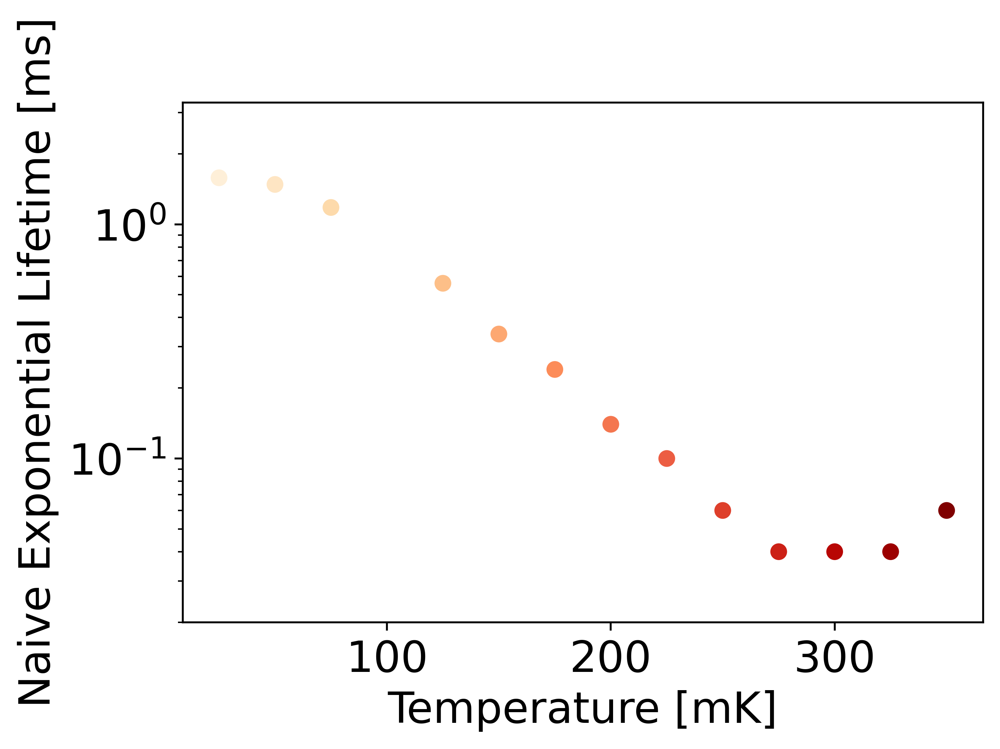

In [5]:
ax = plt.figure(dpi=500).gca()
ax.scatter(temps_mK,lifetimes,c=cmap( temps_mK / np.max(temps_mK) ))
ax.set_xlabel("Temperature [mK]")
ax.set_ylabel("Naive Exponential Lifetime [ms]")
if True:
    ylims = ax.get_ylim()
    ax.set_ylim([0.5*np.min(lifetimes[lifetimes>0]) , 2*ylims[1]])
    ax.set_yscale('log')

In [6]:
kB    = 8.617333262e-5 ## eV/K
Delta = 184e-6 ## eV
tau0  = 438.0e-9 ## sec -- from https://journals.aps.org/prb/abstract/10.1103/PhysRevB.14.4854
Tc    = 1.19 ## K -- from https://journals.aps.org/prb/abstract/10.1103/PhysRevB.14.4854
def theory_curve(T_K,Tc_K,delta_eV,tau0_s):
    return ( (tau0_s/np.sqrt(np.pi)) * 
            np.power(kB*Tc_K/(2*delta_eV),5./2.) * 
            np.sqrt(Tc_K/T_K) * 
            np.exp(delta_eV/(kB*T_K)) )

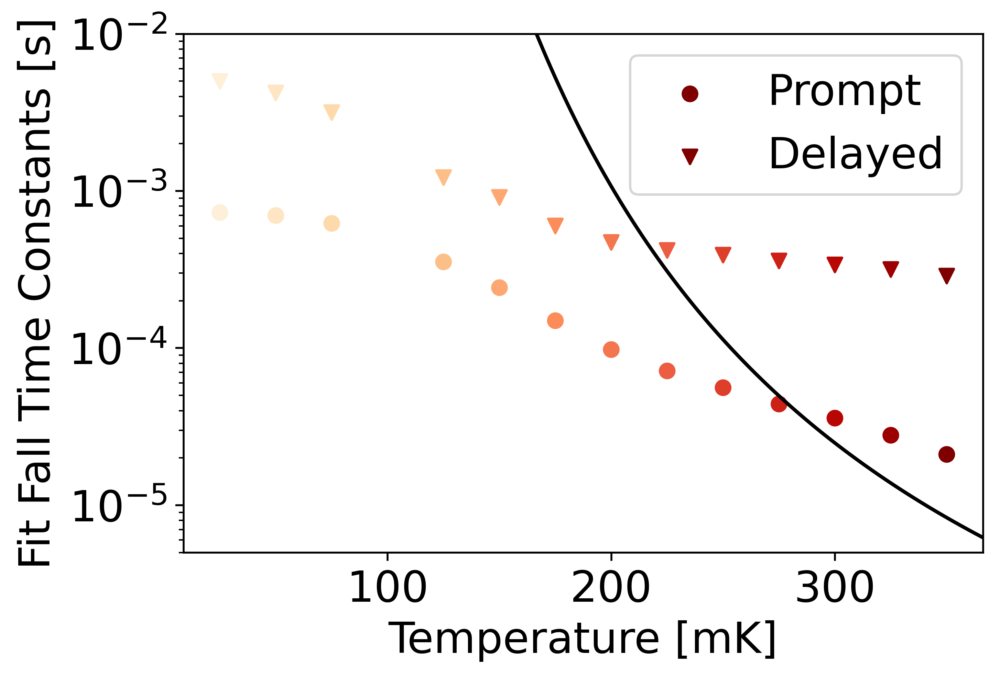

In [7]:
ax = plt.figure(dpi=500).gca()
ax.scatter(temps_mK,prompt_fall_ms*1e-3,c=cmap( temps_mK / np.max(temps_mK) ),marker='o',label="Prompt")
ax.scatter(temps_mK,delayd_fall_ms*1e-3,c=cmap( temps_mK / np.max(temps_mK) ),marker='v',label="Delayed")
ax.set_xlabel("Temperature [mK]")
ax.set_ylabel("Fit Fall Time Constants [s]")
if True:
    ylims = ax.get_ylim()
    ax.set_ylim([0.3*np.min(lifetimes[delayd_fall_ms>0]*1e-3) , 2*ylims[1]])
    if True:
        ax.set_ylim([5e-6,1e-2])
    ax.set_yscale('log')
if True:
    xlims = ax.get_xlim()
    ylims = ax.get_ylim()
    xrange = np.linspace(start=xlims[0],stop=xlims[1],num=1000)
    theory = theory_curve(xrange/1e3,Tc,Delta,tau0)
    ax.plot(xrange,theory,'k-')
    ax.set_xlim(xlims)
    ax.set_ylim(ylims)
ax.legend(loc='best')

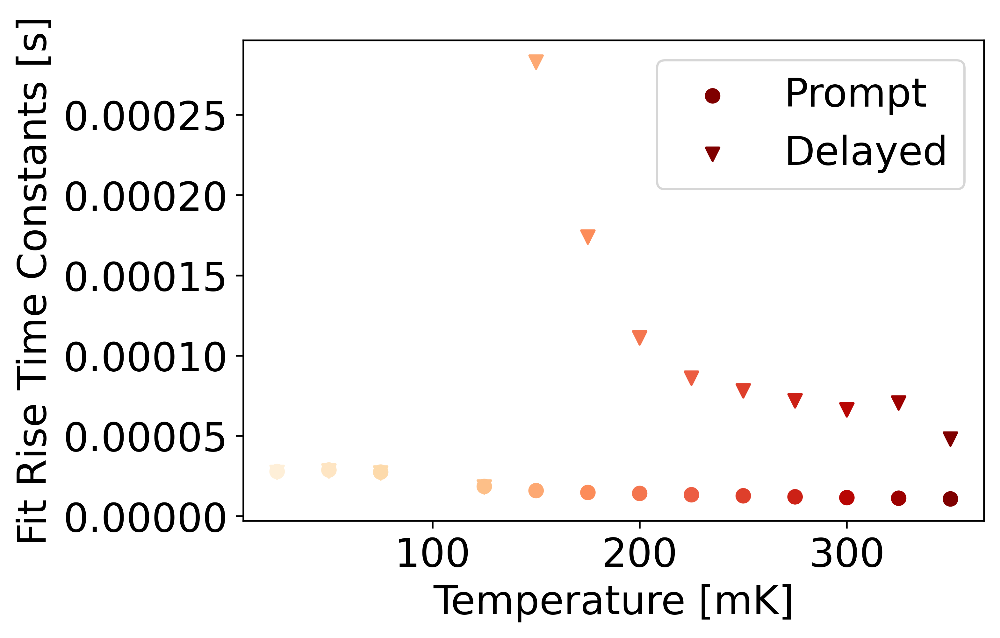

In [15]:
ax = plt.figure(dpi=500).gca()
ax.scatter(temps_mK,prompt_rise_ms*1e-3,c=cmap( temps_mK / np.max(temps_mK) ),marker='o',label="Prompt")
ax.scatter(temps_mK,delayd_rise_ms*1e-3,c=cmap( temps_mK / np.max(temps_mK) ),marker='v',label="Delayed")
ax.set_xlabel("Temperature [mK]")
ax.set_ylabel("Fit Rise Time Constants [s]")
if False:
    ylims = ax.get_ylim()
    ax.set_ylim([0.3*np.min(lifetimes[delayd_rise_ms>0]*1e-3) , 2*ylims[1]])
    if False:
        ax.set_ylim([5e-6,1e-2])
    ax.set_yscale('log')
ax.legend(loc='best')

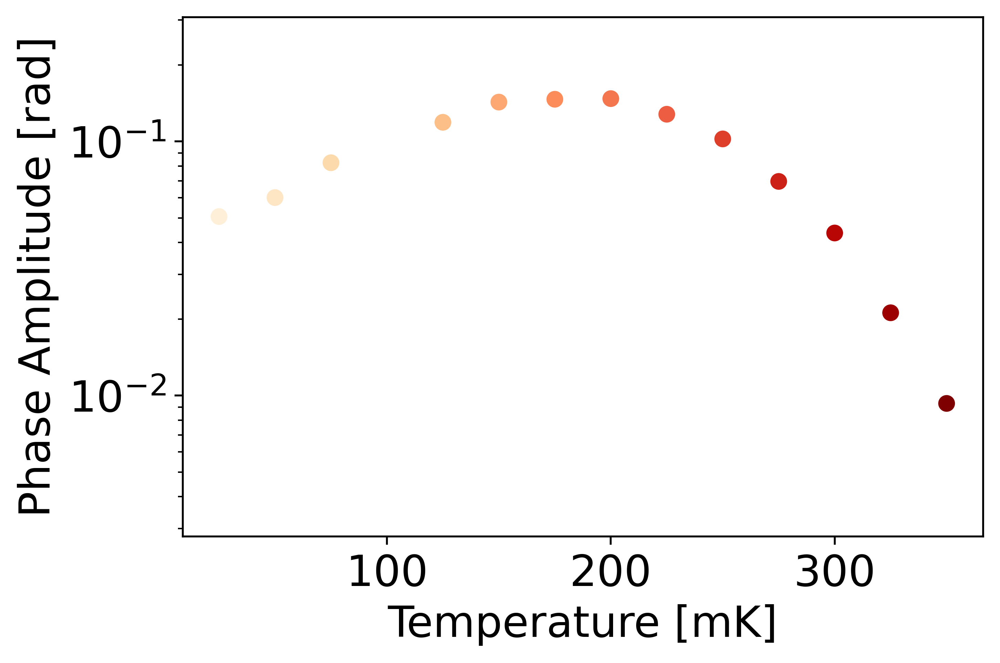

In [9]:
ax = plt.figure(dpi=500).gca()
ax.scatter(temps_mK,pulse_max_phse,c=cmap( temps_mK / np.max(temps_mK) ),marker='o')
ax.set_xlabel("Temperature [mK]")
ax.set_ylabel("Phase Amplitude [rad]")
if True:
    ylims = ax.get_ylim()
    ax.set_ylim([0.3*np.min(pulse_max_phse[pulse_max_phse>0]) , 2*ylims[1]])
    ax.set_yscale('log')

In [10]:
data_freq = pd.read_hdf(f_avg_name, key="freq")
data_diss = pd.read_hdf(f_avg_name, key="diss")

350mK----------
-- Exp guess: 0.0600000000000005 ms Amp: 6.816467099363888e+29
325mK----------
-- Exp guess: 0.040000000000000036 ms Amp: 8.521891836286553e+47
300mK----------
-- Exp guess: 0.040000000000000036 ms Amp: 9.476099688265215e+47
275mK----------
-- Exp guess: 0.040000000000000036 ms Amp: 9.420502260328405e+47
250mK----------
-- Exp guess: 0.05999999999999872 ms Amp: 8.065460524906715e+29
225mK----------
-- Exp guess: 0.07999999999999918 ms Amp: 7.147020278298812e+20
200mK----------
-- Exp guess: 0.11999999999999922 ms Amp: 630822588065.8721
175mK----------
-- Exp guess: 0.21999999999999975 ms Amp: 3432.5066335377965
150mK----------
-- Exp guess: 0.3200000000000003 ms Amp: 2.730557391406273
125mK----------
-- Exp guess: 0.5199999999999996 ms Amp: 0.0055718581575736155
75mK----------
-- Exp guess: 1.0999999999999988 ms Amp: 2.2288946569169198e-05
50mK----------
-- Exp guess: 1.3599999999999994 ms Amp: 6.513097251090672e-06
25mK----------
-- Exp guess: 1.459999999999999 ms Amp:

(4.5, 10.0)

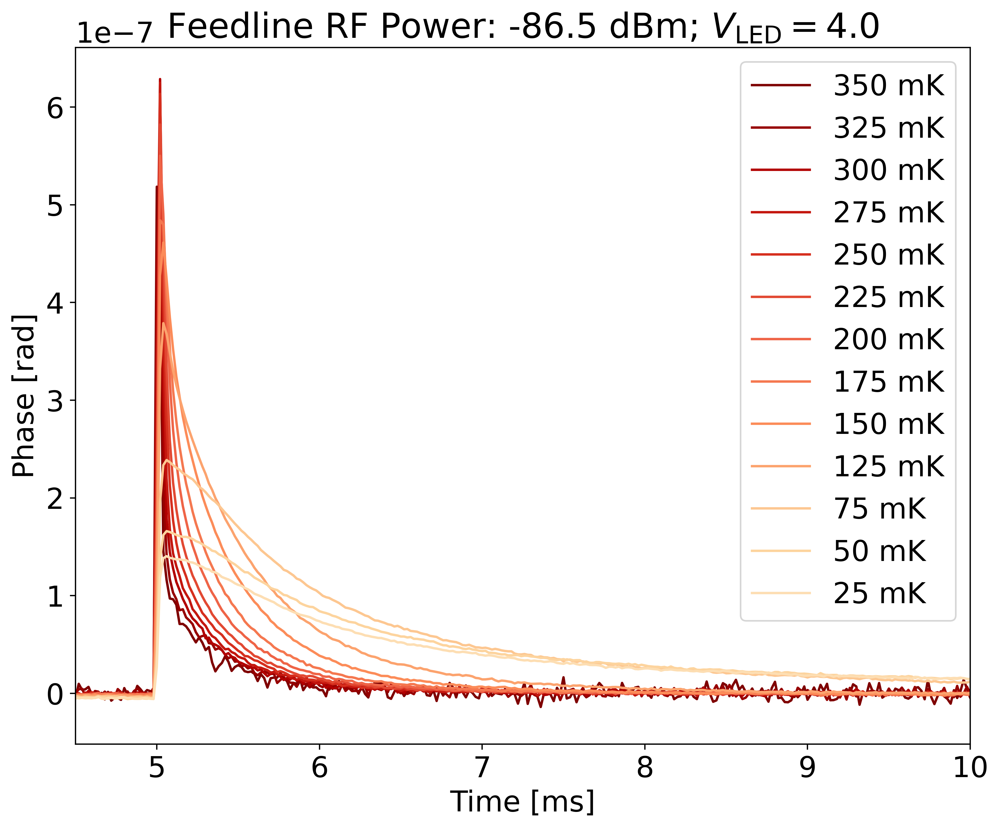

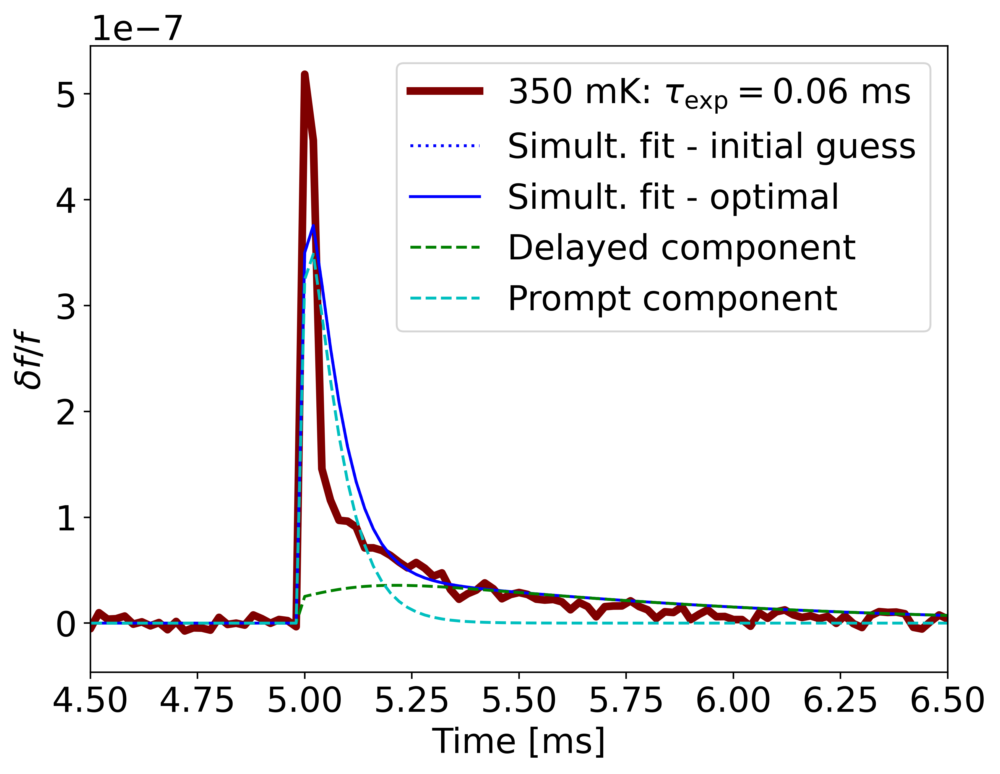

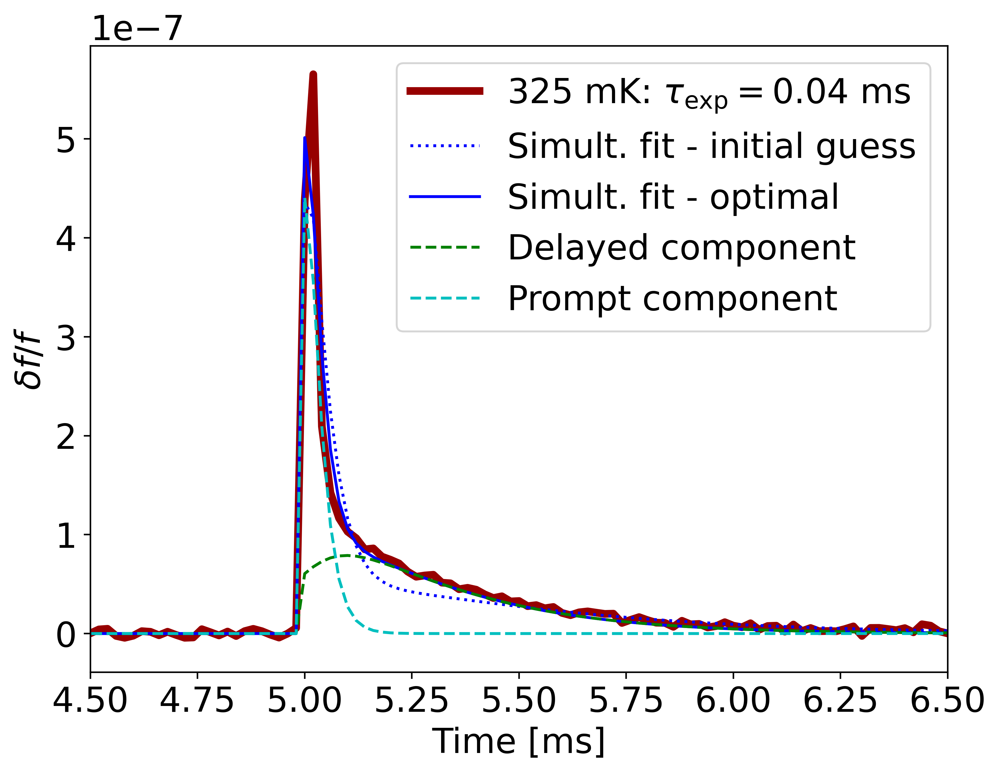

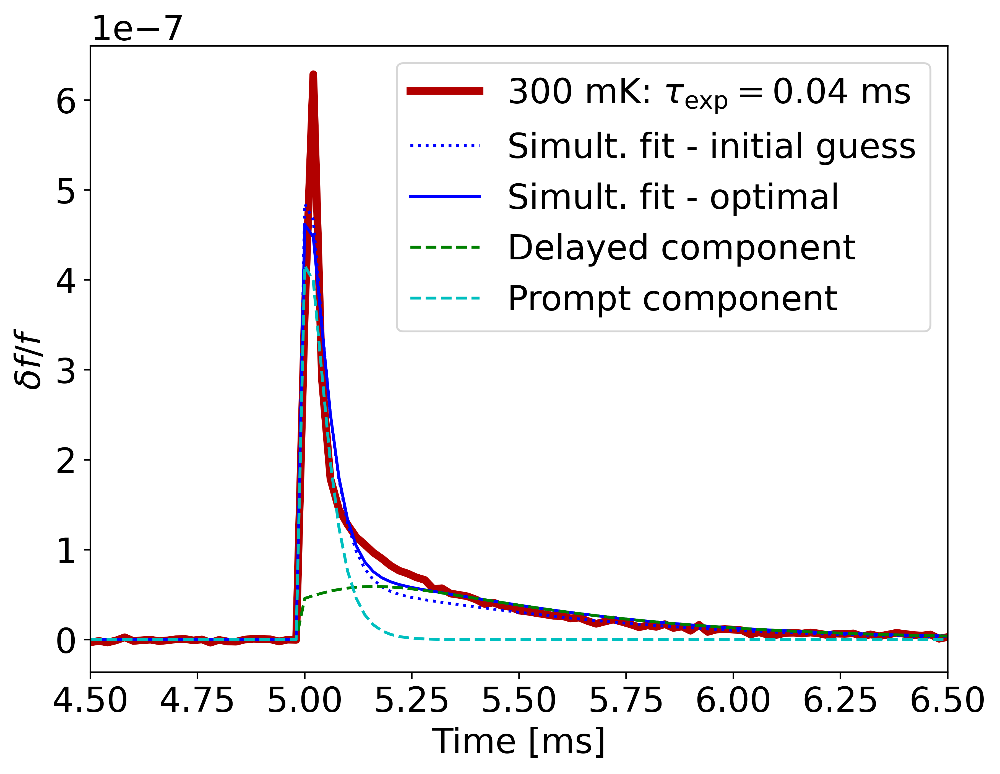

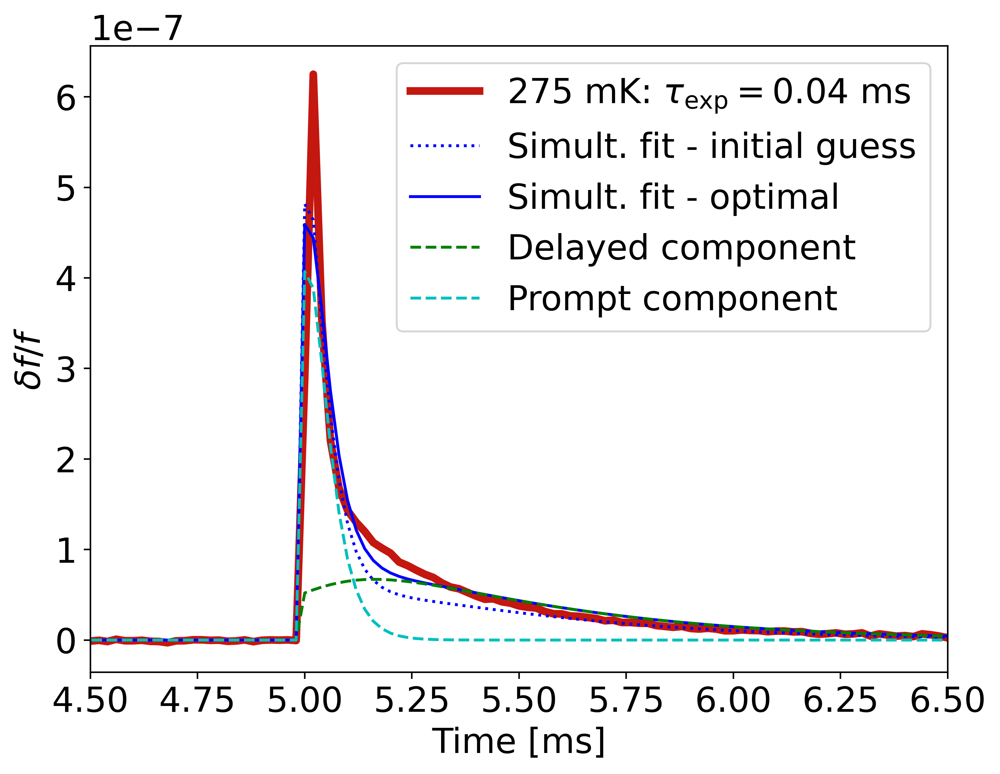

...

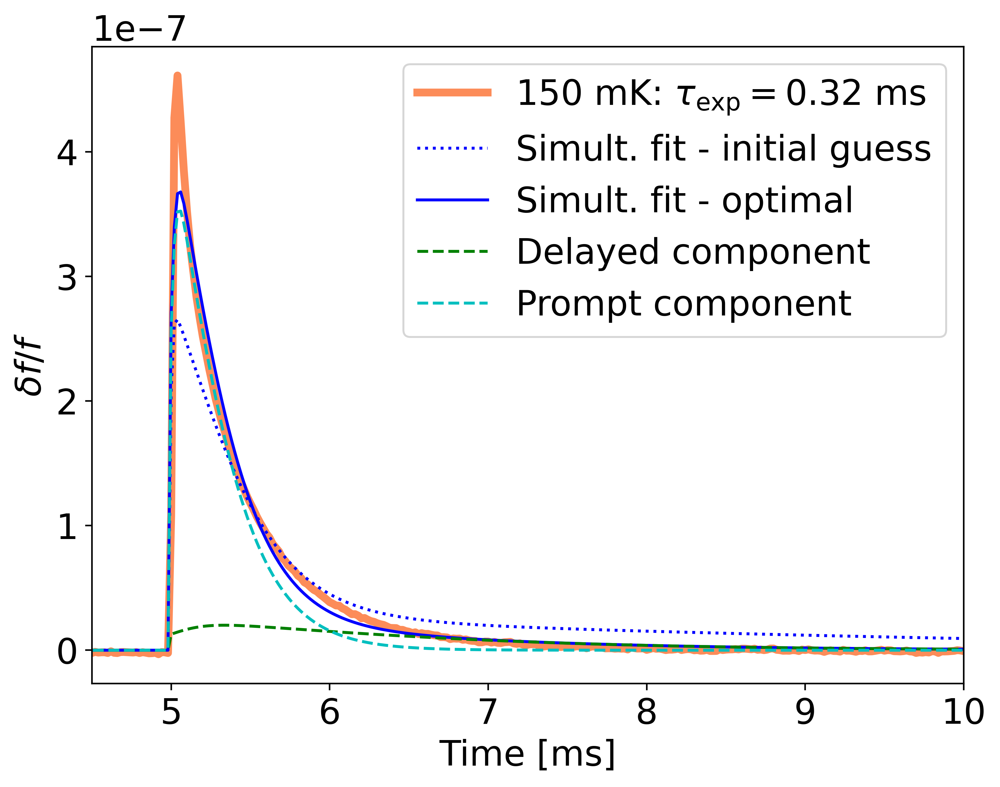

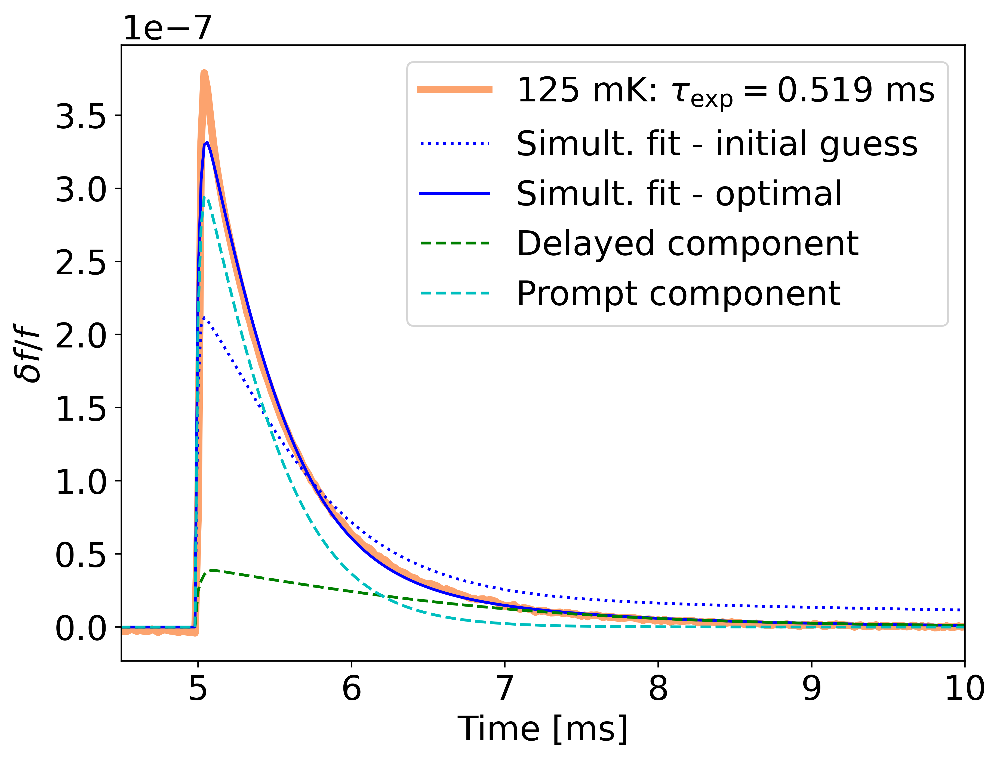

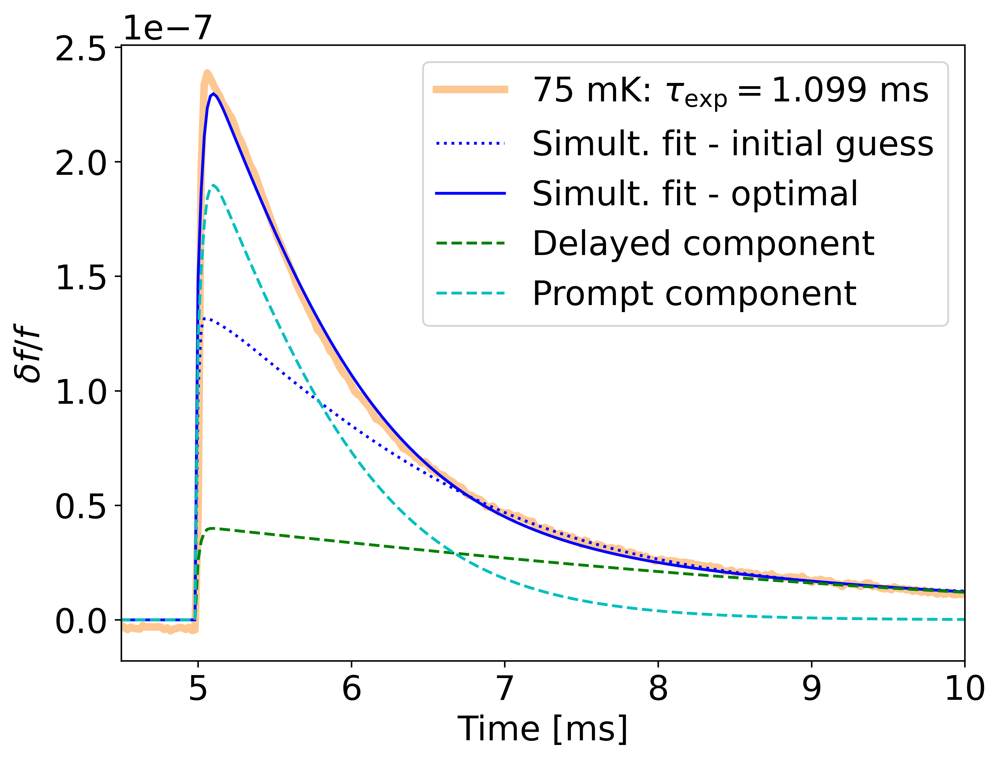

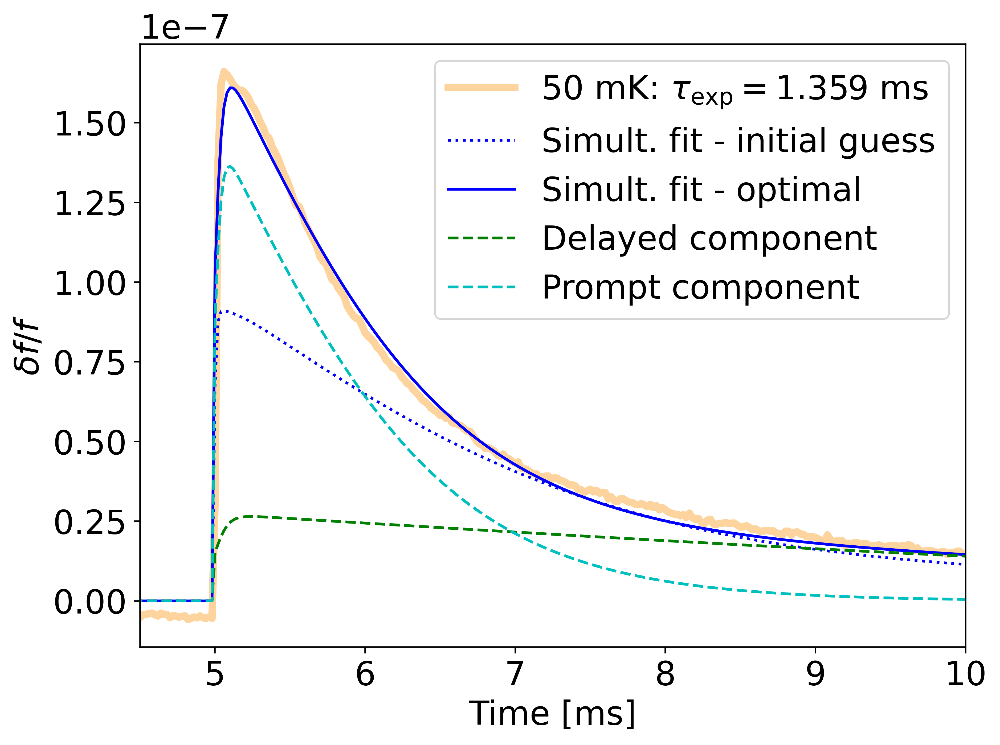

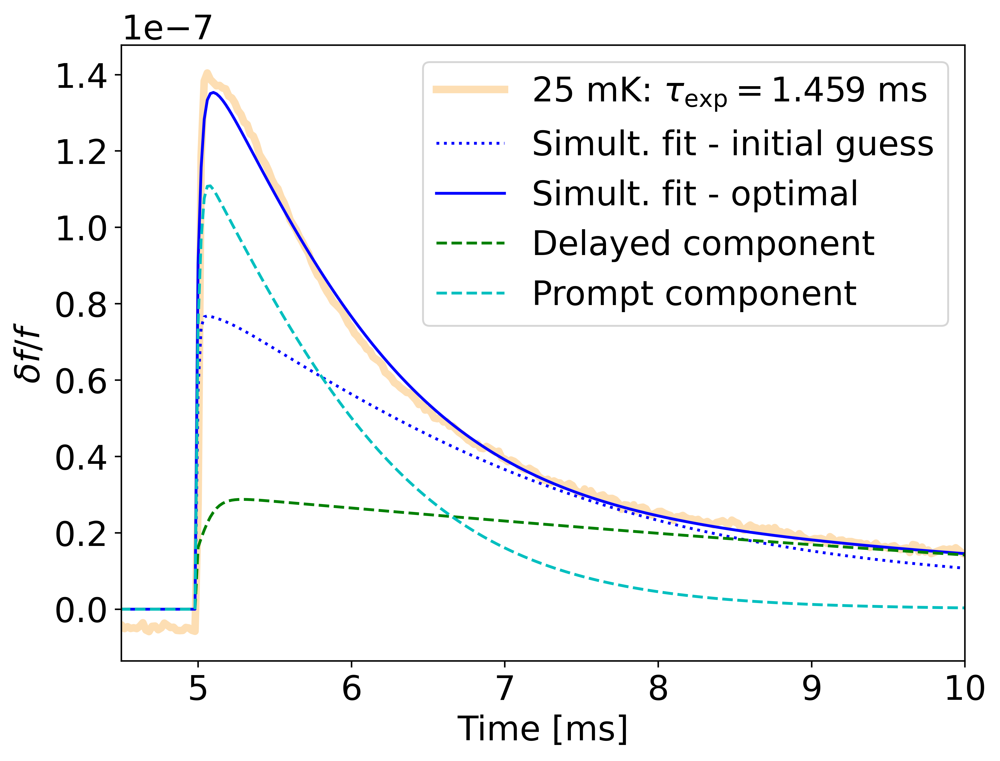

In [11]:
## Create a figure for all pulses
plt.figure("A",figsize=(10,8),dpi=500)
ax0 = plt.gca()
ax0.set_xlabel("Time [ms]")
ax0.set_ylabel("Phase [rad]")
ax0.set_title("Feedline RF Power: "+str(-30-line_atten_dB)+r" dBm; $V_\mathrm{LED}=$"+str(4.00))
cmap = plt.get_cmap('OrRd')
xlims = [4.5, 10.0]

## Initialize containers for our initial guesses
N_temps = len(temps_mK)
lifetimes  = np.zeros(N_temps)
amplitudes = np.zeros(N_temps)

prompt_fall_ms = np.zeros(N_temps)
delayd_fall_ms = np.zeros(N_temps)
pulse_max_phse = np.zeros(N_temps)

for i in np.arange(N_temps):
    k = data.keys()[1+i]
    print(k+ "mK----------")
    
    ## Get the color for this temperature
    color=cmap( (float(k)+50) / (np.max(temps_mK)+50) )
    
    ## Pull the averate pulse and time values
    t_vals = np.array(data["time(ms)"]) #- ts
    p_vals = np.array(data_freq[k])
    
    p_vals = p_vals[t_vals<15.0]
    t_vals = t_vals[t_vals<15.0]
    
    ## Make some guesses of the prompt parameters
    _p_max = np.max(p_vals)
    _t_max = t_vals[np.argmax(p_vals)]
    _p_1pe = _p_max*np.exp(-1)
    _p_2pe = _p_max*np.exp(-2)
    _p_3pe = _p_max*np.exp(-3)
    
    _ts_vals = t_vals[t_vals>t0][3:]
    _ps_vals = p_vals[t_vals>t0][3:]
    
    _t_1pe = _ts_vals[np.argmin(np.abs(_ps_vals-_p_1pe))]
    _t_2pe = _ts_vals[np.argmin(np.abs(_ps_vals-_p_2pe))]
    _t_3pe = _ts_vals[np.argmin(np.abs(_ps_vals-_p_3pe))]
    
    ## Turn those quantities into parameters - this are the prompt values
    tau_guess = _t_1pe - _t_max
    amp_guess = np.max(p_vals)*np.exp(t0/tau_guess)
    
    ## Initialize our guess array for fitting to a single exponential
    popt = [ amp_guess, np.max([0.01,tau_guess]) ]
    print("-- Exp guess:", popt[1], "ms", "Amp:",amp_guess)
    
    ## Save our calculated guesses
    lifetimes[i]  = popt[1]
    amplitudes[i] = popt[0]
    
    #### === FIT ALL AT ONCE === ###
    
    prompt_t = 0.01
    prompt_a = np.max(p_vals) * np.exp((_t_max-t0)/popt[1]) / (1-np.exp(-(_t_max-t0)/prompt_t))
    prompt_k = popt[1]
    
    delay_a = prompt_a/10
    delay_t = 0.1
    delay_k = 10.*popt[1]
    
    ## Prepare to plot the prompt guess
    all_opt   = [delay_a,delay_t,delay_k,prompt_a,prompt_t,prompt_k]
    all_guess = dbl_pls_shape(t_vals,all_opt[0],all_opt[1],all_opt[2],all_opt[3],all_opt[4],all_opt[5])
    
    ## Fit the overall shape
    all_opt, all_cov = curve_fit(dbl_pls_shape,t_vals,p_vals,p0=all_opt,bounds=(0,np.inf))
    all_pls = dbl_pls_shape(t_vals,all_opt[0],all_opt[1],all_opt[2],all_opt[3],all_opt[4],all_opt[5])
    
    prompt_fall_ms[i] = all_opt[5]
    delayd_fall_ms[i] = all_opt[2]
    pulse_max_phse[i] = _p_max
    
    #### === ==================== === ###
    
    ## Add the average pulse to the to the plot of all temperatures
    ax0.plot( t_vals, p_vals, label=k+r" mK" , color=color)
    
    ## Create a new plot for each individual temperature
    plt.figure(str(i)+"B",figsize=(8,6),dpi=500)
    ax1 = plt.gca()
    ax1.set_xlabel("Time [ms]")
    ax1.set_ylabel(r"$\delta f/f$")
    
    ## Plot the pulse and e-foldings
    ax1.plot( t_vals, p_vals, label=k+r" mK: $\tau_\mathrm{exp}=$"+str(int(popt[1]*1e3)/1000.)+" ms", color=color, linewidth=4)
    ylims = ax1.get_ylim()
    
    ## Draw the overall shape
    ax1.plot( t_vals, all_guess, 'b:', label="Simult. fit - initial guess")
    ax1.plot( t_vals, all_pls, 'b-', label="Simult. fit - optimal")
    
    ax1.plot( t_vals, double_exp(t_vals,all_opt[0],all_opt[1],all_opt[2]), 'g--', label="Delayed component")
    ax1.plot( t_vals, double_exp(t_vals,all_opt[3],all_opt[4],all_opt[5]), 'c--', label="Prompt component")
    
    ## Finalize the axes
    ax1.set_xlim(xlims if float(k)<201.0 else [xlims[0],6.5])#10.0])
    ax1.legend()
    
ax0.legend()
ax0.set_xlim([xlims[0],10.0])

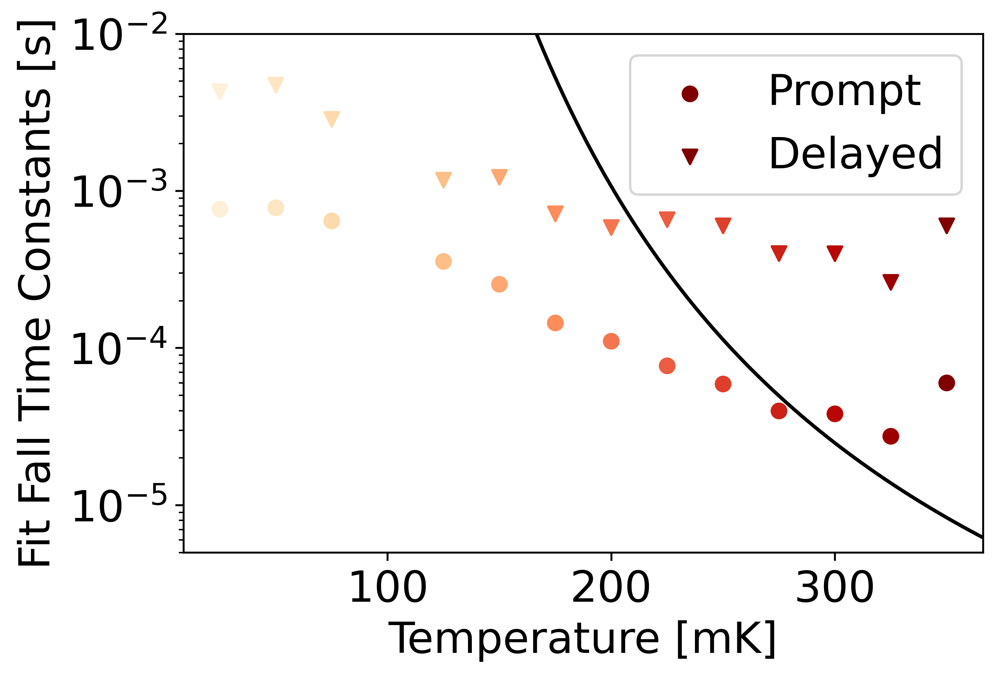

In [12]:
ax = plt.figure(dpi=500).gca()
ax.scatter(temps_mK,prompt_fall_ms*1e-3,c=cmap( temps_mK / np.max(temps_mK) ),marker='o',label="Prompt")
ax.scatter(temps_mK,delayd_fall_ms*1e-3,c=cmap( temps_mK / np.max(temps_mK) ),marker='v',label="Delayed")
ax.set_xlabel("Temperature [mK]")
ax.set_ylabel("Fit Fall Time Constants [s]")
if True:
    ylims = ax.get_ylim()
    ax.set_ylim([0.3*np.min(lifetimes[delayd_fall_ms>0]*1e-3) , 2*ylims[1]])
    if True:
        ax.set_ylim([5e-6,1e-2])
    ax.set_yscale('log')
if True:
    xlims = ax.get_xlim()
    ylims = ax.get_ylim()
    xrange = np.linspace(start=xlims[0],stop=xlims[1],num=1000)
    theory = theory_curve(xrange/1e3,Tc,Delta,tau0)
    ax.plot(xrange,theory,'k-')
    ax.set_xlim(xlims)
    ax.set_ylim(ylims)
ax.legend(loc='best')

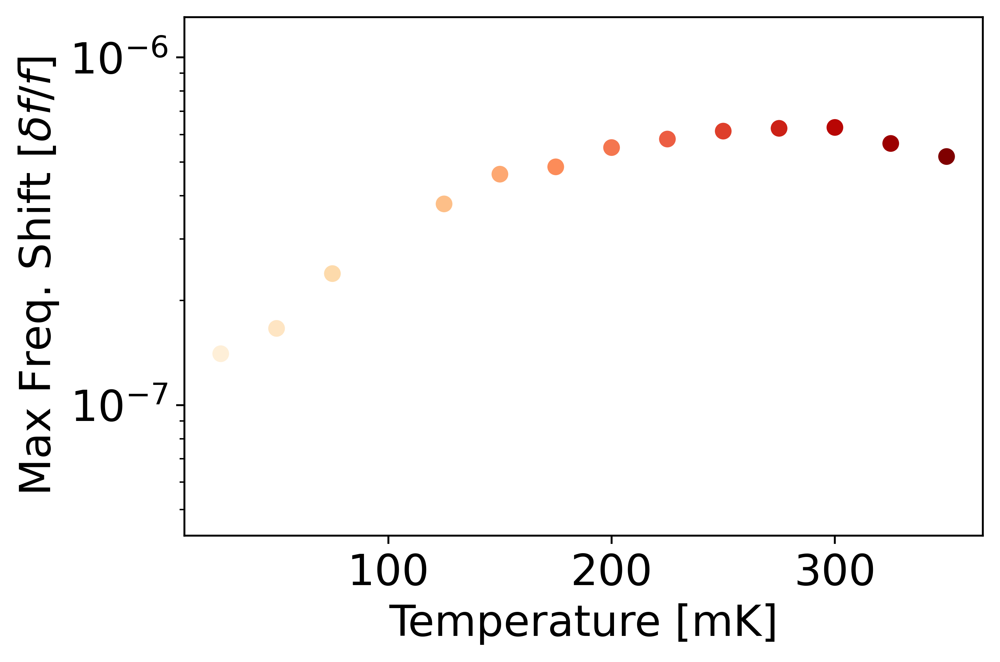

In [13]:
ax = plt.figure(dpi=500).gca()
ax.scatter(temps_mK,pulse_max_phse,c=cmap( temps_mK / np.max(temps_mK) ),marker='o')
ax.set_xlabel("Temperature [mK]")
ax.set_ylabel(r"Max Freq. Shift [$\delta f/f$]")
if True:
    ylims = ax.get_ylim()
    ax.set_ylim([0.3*np.min(pulse_max_phse[pulse_max_phse>0]) , 2*ylims[1]])
    ax.set_yscale('log')